<a href="https://colab.research.google.com/github/dibab64/deeplearning-dibab/blob/main/yolov8voc2007.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar
!tar -xvf VOCtrainval_06-Nov-2007.tar
!python object_detection/dataset_tools/create_pascal_tf_record.py \
    --label_map_path=object_detection/data/pascal_label_map.pbtxt \
    --data_dir=VOCdevkit --year=VOC2007 --set=train \
    --output_path=pascal_train.record
!python object_detection/dataset_tools/create_pascal_tf_record.py \
    --label_map_path=object_detection/data/pascal_label_map.pbtxt \
    --data_dir=VOCdevkit --year=VOC2007 --set=val \
    --output_path=pascal_val.record

Görüntülenen çıkış son 5000 satıra kısaltıldı.
VOCdevkit/VOC2007/JPEGImages/001734.jpg
VOCdevkit/VOC2007/JPEGImages/001738.jpg
VOCdevkit/VOC2007/JPEGImages/001739.jpg
VOCdevkit/VOC2007/JPEGImages/001741.jpg
VOCdevkit/VOC2007/JPEGImages/001746.jpg
VOCdevkit/VOC2007/JPEGImages/001747.jpg
VOCdevkit/VOC2007/JPEGImages/001749.jpg
VOCdevkit/VOC2007/JPEGImages/001750.jpg
VOCdevkit/VOC2007/JPEGImages/001752.jpg
VOCdevkit/VOC2007/JPEGImages/001754.jpg
VOCdevkit/VOC2007/JPEGImages/001755.jpg
VOCdevkit/VOC2007/JPEGImages/001756.jpg
VOCdevkit/VOC2007/JPEGImages/001758.jpg
VOCdevkit/VOC2007/JPEGImages/001759.jpg
VOCdevkit/VOC2007/JPEGImages/001761.jpg
VOCdevkit/VOC2007/JPEGImages/001765.jpg
VOCdevkit/VOC2007/JPEGImages/001766.jpg
VOCdevkit/VOC2007/JPEGImages/001768.jpg
VOCdevkit/VOC2007/JPEGImages/001771.jpg
VOCdevkit/VOC2007/JPEGImages/001772.jpg
VOCdevkit/VOC2007/JPEGImages/001775.jpg
VOCdevkit/VOC2007/JPEGImages/001777.jpg
VOCdevkit/VOC2007/JPEGImages/001778.jpg
VOCdevkit/VOC2007/JPEGImages/0017

In [ ]:
!pip install keras-cv==0.5.1
!pip install keras-core

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 742.0/742.0 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 15.0 MB/s eta 0:00:00


In [ ]:
import os
import xml.etree.ElementTree as ET
import tensorflow as tf
import keras_cv
import requests
import zipfile

from tqdm.auto import tqdm
from tensorflow import keras
from keras_cv import bounding_box
from keras_cv import visualization

In [73]:
SPLIT_RATIO = 0.2
BATCH_SIZE = 16 #düşük seviyeli yükseltilip denenecek TODO : optimizasyon 64
LEARNING_RATE = 0.001
EPOCH = 25
GLOBAL_CLIPNORM = 10.0

In [74]:
class_ids = [
      'person', 'horse', 'car', 'aeroplane', 'cat', 'chair', 'train',
       'sofa', 'tvmonitor', 'boat', 'dog', 'pottedplant', 'bird',
       'bicycle', 'diningtable', 'motorbike', 'bottle', 'sheep', 'cow',
       'bus'
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))


path_images = "/content/VOCdevkit/VOC2007/JPEGImages"
path_annot = "/content/VOCdevkit/VOC2007/Annotations"


xml_files = sorted(
    [
        os.path.join(path_annot, file_name)
        for file_name in os.listdir(path_annot)
        if file_name.endswith(".xml")
    ]
)

jpg_files = sorted(
    [
        os.path.join(path_images, file_name)
        for file_name in os.listdir(path_images)
        if file_name.endswith(".jpg")
    ]
)

In [75]:
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    image_name = root.find("filename").text
    image_path = os.path.join(path_images, image_name)

    boxes = []
    classes = []
    for obj in root.iter("object"):
        cls = obj.find("name").text
        classes.append(cls)

        bbox = obj.find("bndbox")
        xmin = float(bbox.find("xmin").text)
        ymin = float(bbox.find("ymin").text)
        xmax = float(bbox.find("xmax").text)
        ymax = float(bbox.find("ymax").text)
        boxes.append([xmin, ymin, xmax, ymax])

    class_ids = [
        list(class_mapping.keys())[list(class_mapping.values()).index(cls)]
        for cls in classes
    ]
    return image_path, boxes, class_ids


image_paths = []
bbox = []
classes = []
for xml_file in tqdm(xml_files):
    image_path, boxes, class_ids = parse_annotation(xml_file)
    image_paths.append(image_path)
    bbox.append(boxes)
    classes.append(class_ids)

  0%|          | 0/5011 [00:00<?, ?it/s]

In [76]:
bbox = tf.ragged.constant(bbox)
classes = tf.ragged.constant(classes)
image_paths = tf.ragged.constant(image_paths)

data = tf.data.Dataset.from_tensor_slices((image_paths, classes, bbox))

In [77]:
# Determine the number of validation samples
num_val = int(len(xml_files) * SPLIT_RATIO)

# Split the dataset into train and validation sets
val_data = data.take(num_val)
train_data = data.skip(num_val)

In [78]:
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    return image

def load_dataset(image_path, classes, bbox):
    # Read Image
    image = load_image(image_path)
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bbox,
    }
    return {"images": tf.cast(image, tf.float32), "bounding_boxes": bounding_boxes}

augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xyxy"),
        keras_cv.layers.JitteredResize(
            target_size=(640, 640),
            scale_factor=(1.0, 1.0),
            bounding_box_format="xyxy",
        ),
    ]
)

train_ds = train_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(BATCH_SIZE * 4)
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
train_ds = train_ds.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)

In [79]:
resizing = keras_cv.layers.JitteredResize(
    target_size=(640, 640),
    scale_factor=(1.0, 1.0),
    bounding_box_format="xyxy",
)

val_ds = val_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.shuffle(BATCH_SIZE * 4)
val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
val_ds = val_ds.map(resizing, num_parallel_calls=tf.data.AUTOTUNE)

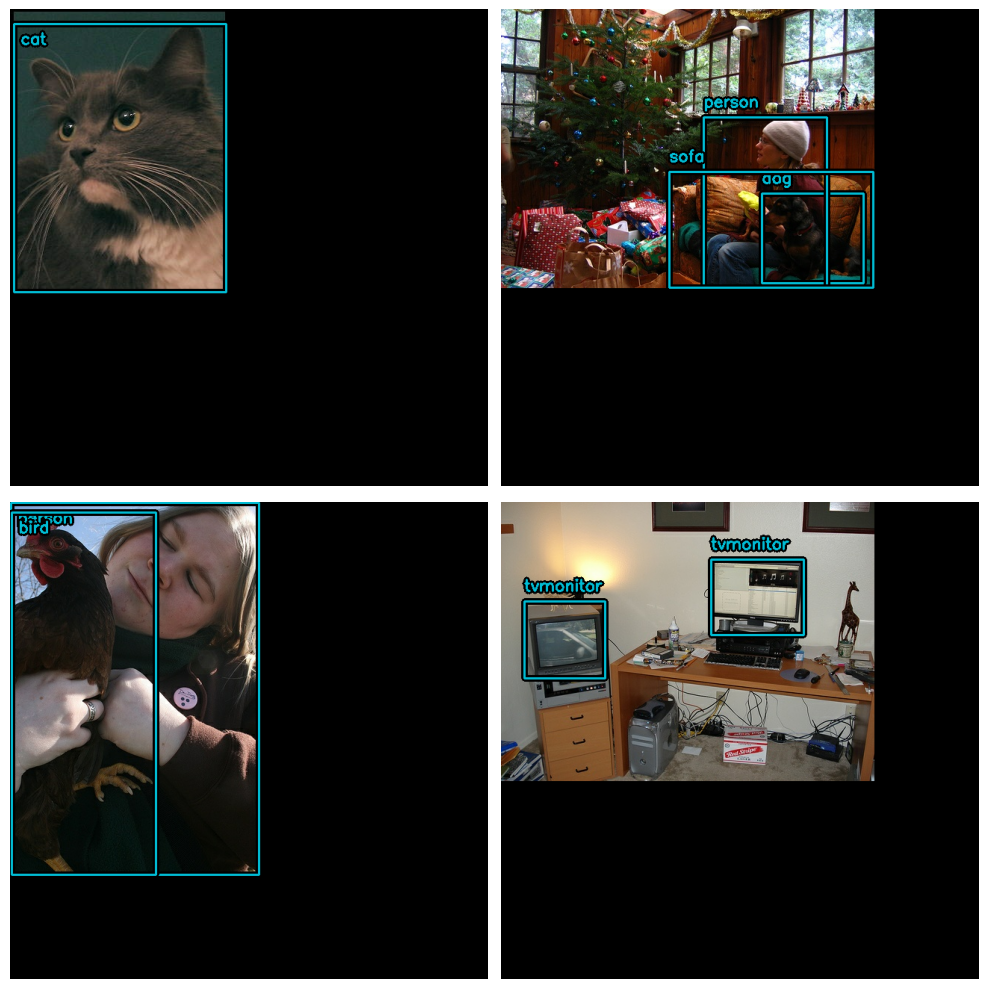

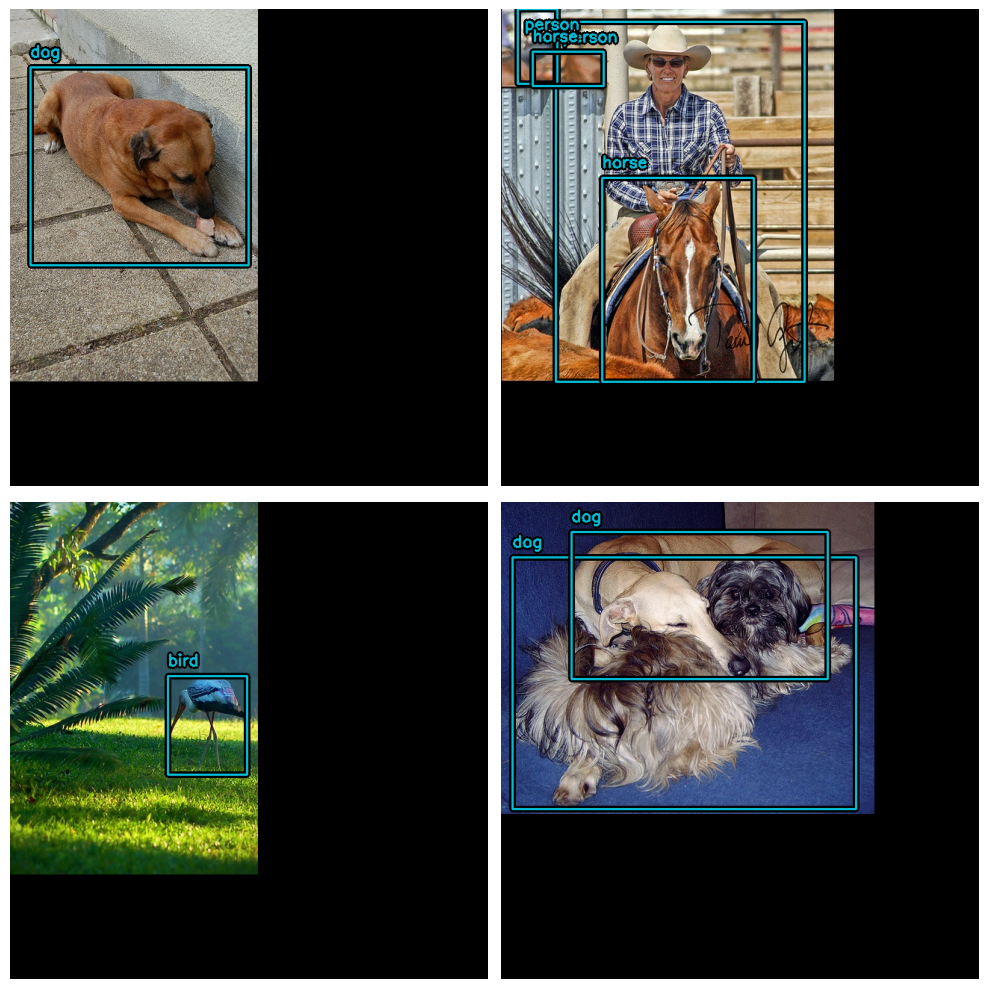

In [80]:
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


visualize_dataset(
    train_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)

visualize_dataset(
    val_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)

In [81]:
def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

In [82]:
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    "yolo_v8_s_backbone_coco",
    load_weights=True
)

yolo = keras_cv.models.YOLOV8Detector(
    num_classes=len(class_mapping),
    bounding_box_format="xyxy",
    backbone=backbone,
    fpn_depth=3,
)

yolo.summary()

Model: "yolov8_detector_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_12 (InputLayer)       [(None, None, None, 3)]      0         []                            
                                                                                                  
 model_5 (Functional)        {'P3': (None, None, None,    5089760   ['input_12[0][0]']            
                             128),                                                                
                              'P4': (None, None, None,                                            
                             256),                                                                
                              'P5': (None, None, None,                                            
                             512)}                                                

In [83]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LEARNING_RATE,
    global_clipnorm=GLOBAL_CLIPNORM,
)
early_s = tf.keras.callbacks.EarlyStopping(
    monitor="val_MaP", patience=10, restore_best_weights=True)

yolo.compile(
    optimizer=optimizer, classification_loss="binary_crossentropy", box_loss="ciou"
)

In [84]:
class EvaluateCOCOMetricsCallback(keras.callbacks.Callback):
    def __init__(self, data, save_path):
        super().__init__()
        self.data = data
        self.metrics = keras_cv.metrics.BoxCOCOMetrics(
            bounding_box_format="xyxy",
            evaluate_freq=1e9,
        )

        self.save_path = save_path
        self.best_map = -1.0

    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        for batch in self.data:
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)
            self.metrics.update_state(y_true, y_pred)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)

        current_map = metrics["MaP"]
        if current_map > self.best_map:
            self.best_map = current_map
            self.model.save(self.save_path)

        return logs

In [85]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs_yolov8small2")

In [ ]:
history = yolo.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=[
        EvaluateCOCOMetricsCallback(val_ds, "model_yolov8small.h5"),
        tensorboard_callback
    ],
)

Epoch 1/25
250/250 [==============================] - ETA: 0s - loss: 44.5224 - box_loss: 2.8693 - class_loss: 41.6531

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


250/250 [==============================] - 276s 886ms/step - loss: 44.5224 - box_loss: 2.8693 - class_loss: 41.6531 - val_loss: 3.7255 - val_box_loss: 2.7741 - val_class_loss: 0.9513 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10]: 0.0000e+00 - Recall@[max_detections=100]: 0.0000e+00 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00
Epoch 2/25
250/250 [==============================] - 217s 863ms/step - loss: 2.9367 - box_loss: 2.4891 - class_loss: 0.4476 - val_loss: 3.2116 - val_box_loss: 2.8260 - val_class_loss: 0.3856 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10

250/250 [==============================] - 217s 866ms/step - loss: 2.3378 - box_loss: 2.1449 - class_loss: 0.1930 - val_loss: 2.4868 - val_box_loss: 2.2817 - val_class_loss: 0.2050 - MaP: 0.0126 - MaP@[IoU=50]: 0.0316 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0126 - Recall@[max_detections=1]: 0.0500 - Recall@[max_detections=10]: 0.0500 - Recall@[max_detections=100]: 0.0500 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0500
Epoch 9/25
250/250 [==============================] - ETA: 0s - loss: 2.2963 - box_loss: 2.1100 - class_loss: 0.1863

250/250 [==============================] - 217s 866ms/step - loss: 2.2963 - box_loss: 2.1100 - class_loss: 0.1863 - val_loss: 2.3684 - val_box_loss: 2.1811 - val_class_loss: 0.1873 - MaP: 0.0281 - MaP@[IoU=50]: 0.0734 - MaP@[IoU=75]: 0.0274 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0660 - Recall@[max_detections=1]: 0.0374 - Recall@[max_detections=10]: 0.0374 - Recall@[max_detections=100]: 0.0374 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0876
Epoch 10/25
250/250 [==============================] - 217s 863ms/step - loss: 2.2602 - box_loss: 2.0791 - class_loss: 0.1811 - val_loss: 2.3072 - val_box_loss: 2.1282 - val_class_loss: 0.1789 - MaP: 0.0106 - MaP@[IoU=50]: 0.0189 - MaP@[IoU=75]: 0.0109 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0195 - Recall@[max_detections=1]: 0.0169 - Recall@[max_detections=10]: 0.0169 - Recall@[max_detections=100]: 0.0169 - Rec

250/250 [==============================] - 220s 875ms/step - loss: 2.0503 - box_loss: 1.8925 - class_loss: 0.1578 - val_loss: 2.1433 - val_box_loss: 1.9853 - val_class_loss: 0.1580 - MaP: 0.0288 - MaP@[IoU=50]: 0.0501 - MaP@[IoU=75]: 0.0338 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0056 - MaP@[area=large]: 0.0421 - Recall@[max_detections=1]: 0.0335 - Recall@[max_detections=10]: 0.0357 - Recall@[max_detections=100]: 0.0357 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0098 - Recall@[area=large]: 0.0529
Epoch 18/25
250/250 [==============================] - 217s 866ms/step - loss: 2.0174 - box_loss: 1.8628 - class_loss: 0.1546 - val_loss: 2.2197 - val_box_loss: 2.0539 - val_class_loss: 0.1658 - MaP: 0.0111 - MaP@[IoU=50]: 0.0266 - MaP@[IoU=75]: 0.0080 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0087 - MaP@[area=large]: 0.0220 - Recall@[max_detections=1]: 0.0196 - Recall@[max_detections=10]: 0.0221 - Recall@[max_detections=100]: 0.0221 - Recall@[area=sm

In [91]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [95]:
 %reload_ext tensorboard
%tensorboard --logdir {'/content/logs_yolov8small2'}

<IPython.core.display.Javascript object>

In [94]:
%reload_ext tensorboard

1/1 [==============================] - 0s 346ms/step


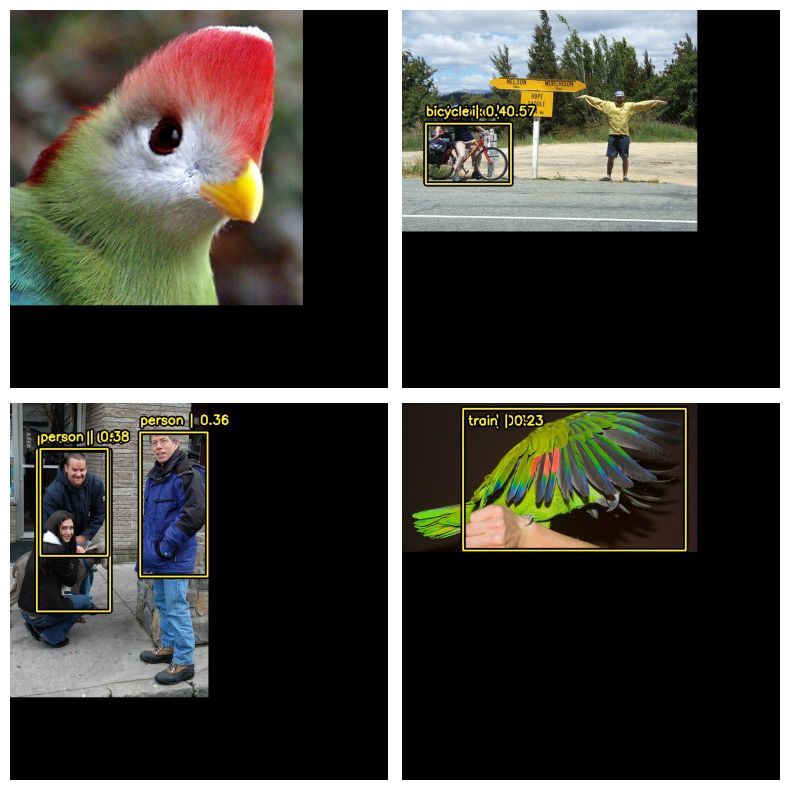

1/1 [==============================] - 0s 338ms/step


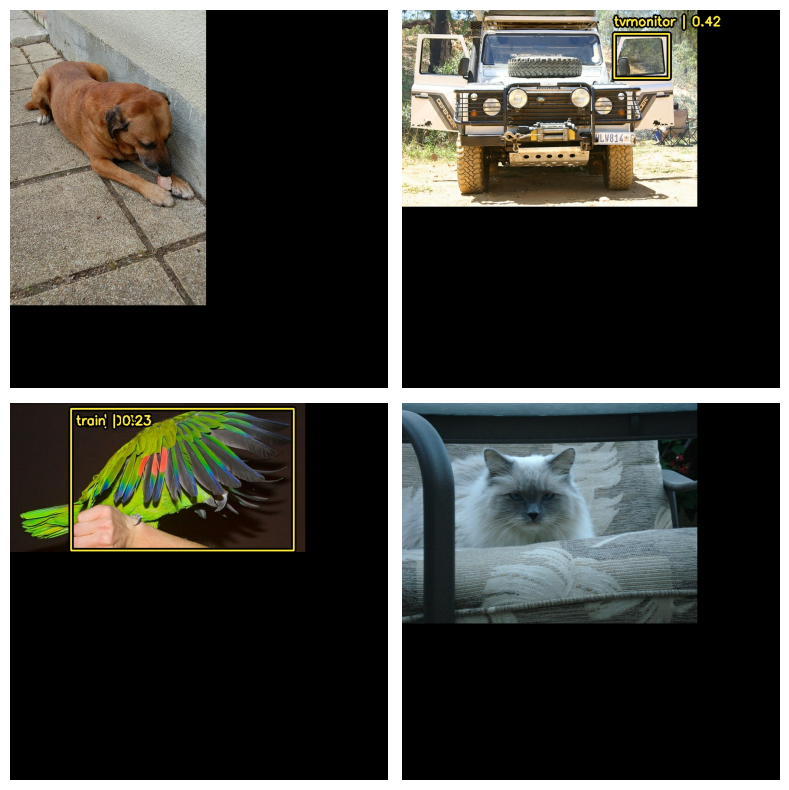

1/1 [==============================] - 0s 341ms/step


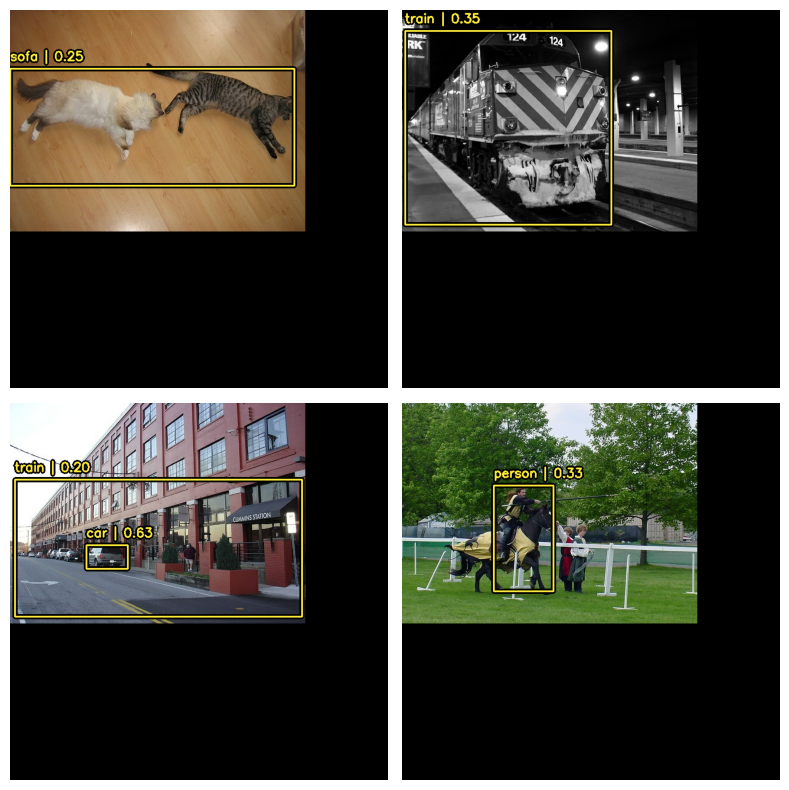

1/1 [==============================] - 0s 330ms/step


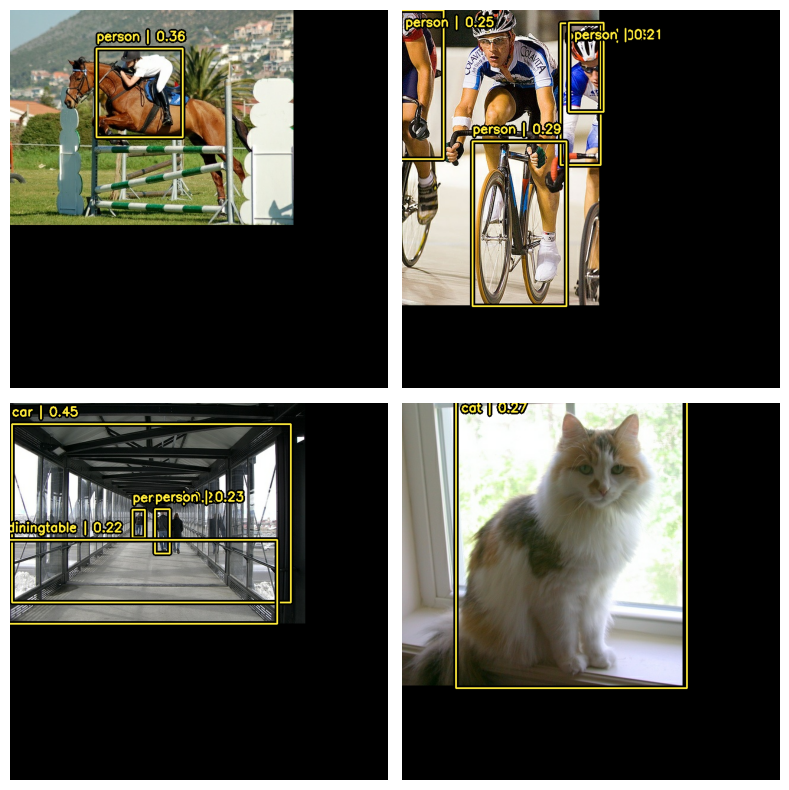

1/1 [==============================] - 0s 337ms/step


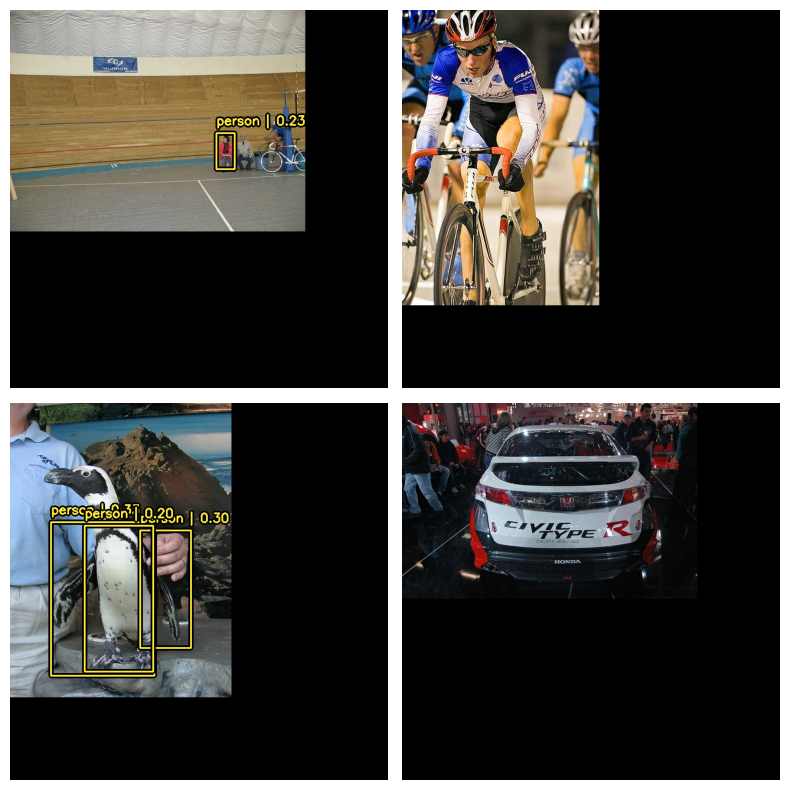

1/1 [==============================] - 0s 336ms/step


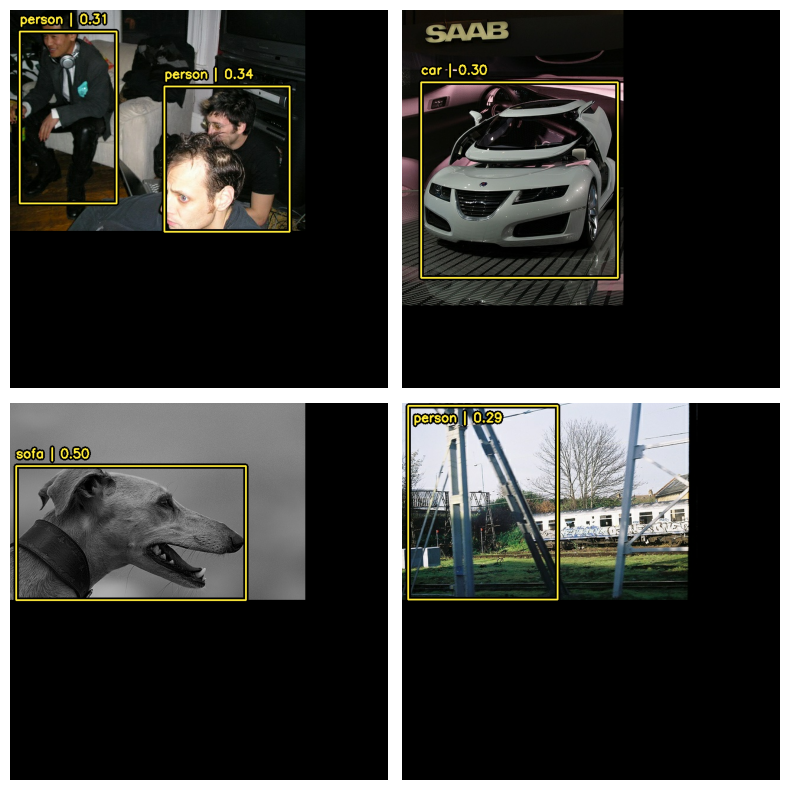

1/1 [==============================] - 0s 319ms/step


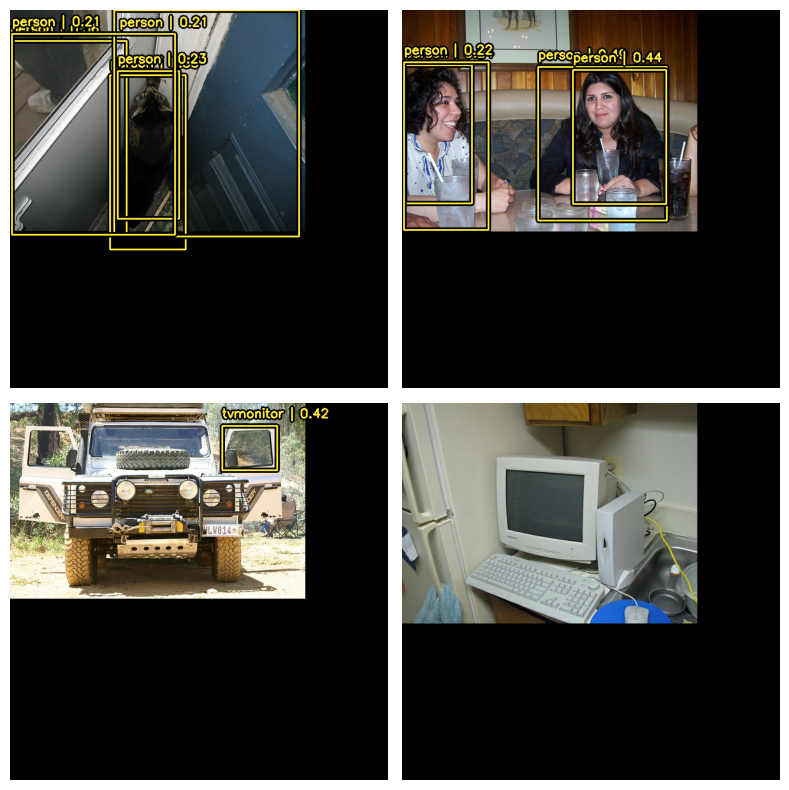

1/1 [==============================] - 0s 340ms/step


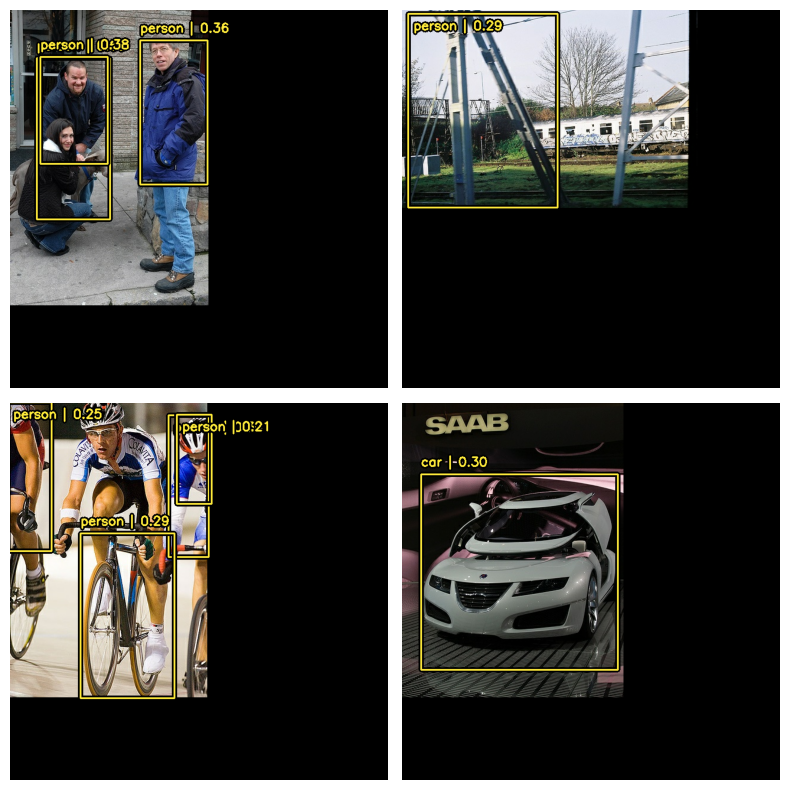

1/1 [==============================] - 0s 327ms/step


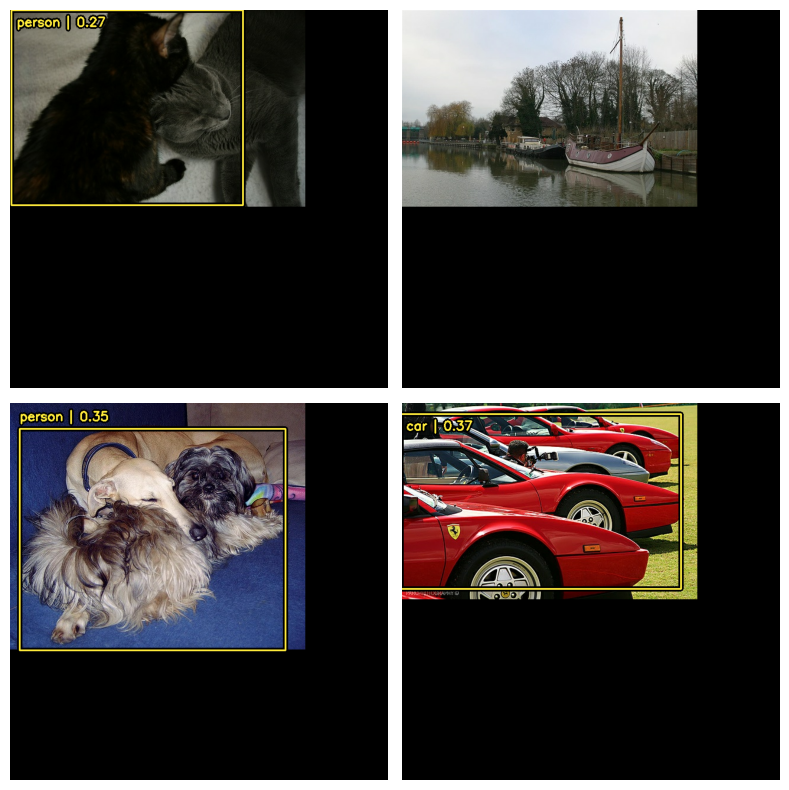

1/1 [==============================] - 0s 327ms/step


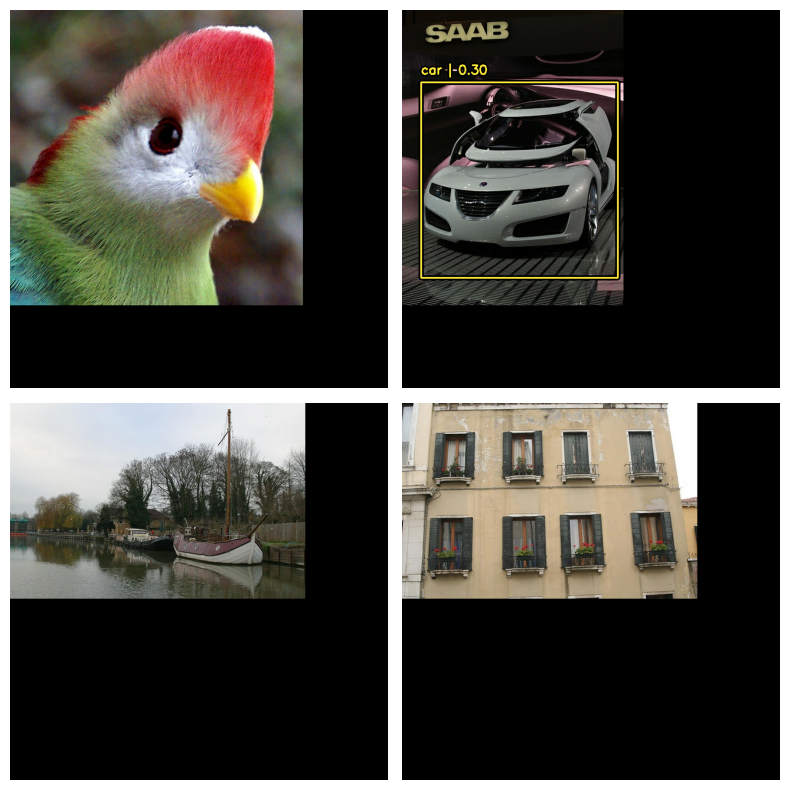

In [92]:
def visualize_detections(model, dataset, bounding_box_format):
    for i in range(10):
        images, y_true = next(iter(dataset.take(i+1)))
        y_pred = model.predict(images)
        y_pred = bounding_box.to_ragged(y_pred)
        visualization.plot_bounding_box_gallery(
            images,
            value_range=(0, 255),
            bounding_box_format=bounding_box_format,
            # y_true=y_true,
            y_pred=y_pred,
            scale=4,
            rows=2,
            cols=2,
            show=True,
            font_scale=0.7,
            class_mapping=class_mapping,
        )
visualize_detections(yolo, dataset=val_ds, bounding_box_format="xyxy")